# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель исследования** — подготовить исследование рынка заведений общественного питания Москвы.

**Ход исследования**
1. Изучить данные файла `moscow_places.csv`, выполнить предобратотку.
2. Провести анализ данных.
3. Выявить интересные особенности данных.
4. Презентовать полученные данные.

## Обзор данных

In [1]:
import pandas as pd # импортируем библиотеку pandas
import numpy as np # импортируем библиотеку numpy
import matplotlib.pyplot as plt # импортируем библиотеку matplotlib
import plotly.express as px # импортируем библиотеку plotly
from plotly import graph_objects as go # импортируем набор методов graph_objects
from folium import Map, Choropleth, Marker # испортируем карту и хороплет
from folium.plugins import MarkerCluster # импортируем кластер
import json

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv') # импортируем данные о заведениях общественного питания

In [3]:
data.head() # выведем первые 5 строчек таблицы

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info() # посмотрим информацию о датафрейме

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод**

Всего заведений *8406*. Не все столбцы заполнены для каждой строки — например, не для всех указаны часы работы, не везде представлены цены и прочие данные, связанные с этим, а также отсутствует информация о количестве посадочных мест. Предположительно это связано с тем, что ответственные за заполнение карточек компаний не внесли данную информацию.

Тип данных во всех строках представлен корректно.

## Предобработка данных

Посмотрим, есть ли полностью повторяющиеся строки.

In [5]:
data.duplicated().sum()

0

Отсутствуют явные дубли. 

Затронем повторяющиеся значения в столбцах. В данном случае это позволительно, так как каждый из столбцов обладает такой информацией, которая не может не повторяться.

Названия заведений могут быть одинаковыми (если нет товарного знака). 
Категории заведений на то и нужны, чтобы сгруппировать места для удобства. 
По одному адресу могут быть несколько заведений.
Часы работы / цены / кол-во мест и т. д. также могут спокойно совпадать.

В связи с вышеописанным работа с дубликатами не требуется.

Приведём названия заведений к нижнему регистру.

In [6]:
data['name'] = data['name'].str.lower()

Проверим, есть ли дубликаты после сделанных выше действий.

In [7]:
print('Количество дубликатов после перевода названий заведений к нижнему регистру', 
      data.duplicated(subset=(['name', 'address'])).sum())

Количество дубликатов после перевода названий заведений к нижнему регистру 3


Удалим дубликаты.

In [8]:
data = data.drop_duplicates(subset=(['name', 'address']))

Добавим столбец `street` для отображения улицы заведения.

In [9]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия'] 
# создадим список для отображения возможных комбинаций преписок к наименованию улицы

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data["street"] = data["address"].str.extract(str_pat)

# источник кода:
# https://ru.stackoverflow.com/questions/1146249/Выделить-часть-строки-по-ключевым-словам

Добавим столбец `is_24/7`, в котором будет содержаться информация о работе заведения ежедневно и круглосуточно (булевый тип данных).

In [10]:
def is_24_7(time_work): # создадим функцию для возврата соответствующего значения
    if time_work != time_work:
        return np.nan
    elif time_work == 'ежедневно, круглосуточно':
        return True
    else:
        return False
    
data['is_24_7'] = data['hours'].apply(is_24_7)

**Вывод**

Привели названия заведений к нижнему регистру.

В датафрейме полностью совпадающих строк нет. Были дубликаты, в которых совпадало название заведения и адрес (3 дубликата) — такие строки удалили.

Для дальнейших анализов были добавлены столбцы с адресом заведения и его типе работы (круглосуточно или нет).

## Анализ данных 

**3.1 Зависимость количества заведений от категории**

Изучим распределение количества заведений в зависимости от категории.

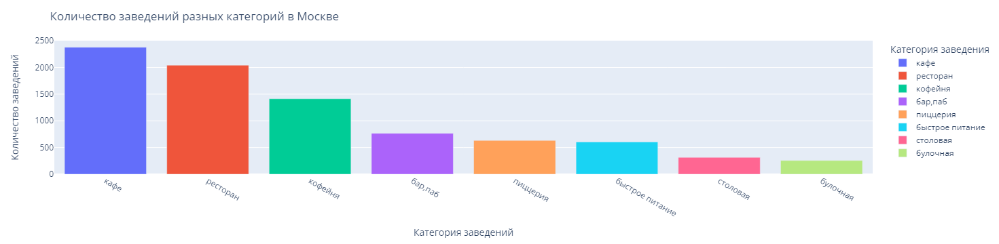

In [11]:
places_types = data.groupby('category', as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False)
# создадим таблицу, в которой укажем количество заведений в разбивке по категориям
fig = px.bar(places_types, x='category', y='name', color = 'category')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Количество заведений разных категорий в Москве',
    xaxis_title="Категория заведений",
    yaxis_title="Количество заведений", legend_title = 'Категория заведения')
fig.show() 
# визуализируем эти данные с помощью столбчатой диаграммы

**Вывод**

Кафе, ресторанов и кофейнь больше всего. Меньше всего столовых и булочных.

**3.2 Зависимость количества заведений от среднего количества посадочных мест**

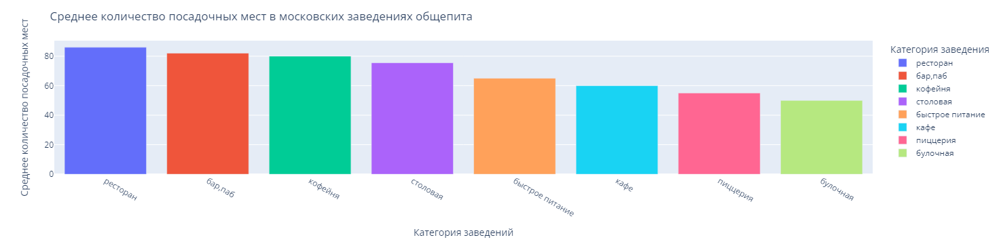

In [13]:
seats_category = data.groupby('category', as_index=False).agg({'seats':'median'}).sort_values(by='seats', ascending=False)
# создадим таблицу, в которой укажем количество заведений в разбивке по среднему количеству посадочных мест
fig = px.bar(seats_category, x='category', y='seats', color = 'category')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Среднее количество посадочных мест в московских заведениях общепита',
    xaxis_title="Категория заведений",
    yaxis_title="Среднее количество посадочных мест", legend_title = 'Категория заведения')
fig.show()
# визуализируем эти данные с помощью столбчатой диаграммы

**Вывод**

Больше 80 (или ровно 80) посадочных мест обычно имеют рестораны, бары / пабы и кофейни, а вот меньше всего мест у пиццерий и булочных, где мест по медианному значению меньше 60.

**3.3 Распределение количества сетевых / несетевых заведений**

/opt/conda/lib/python3.9/site-packages/numpy/core/numeric.py:2446: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



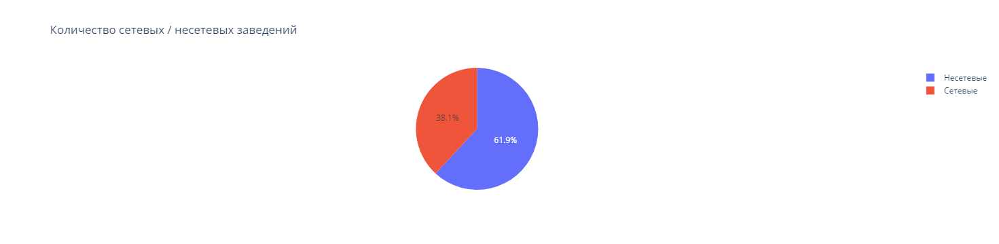

In [14]:
fig = go.Figure(data=go.Pie(labels=data['chain'].value_counts().reset_index()['index'], values=data['chain'].value_counts()))
fig.update_layout(
    title = 'Количество сетевых / несетевых заведений')
for column in fig.data:
    column['labels']=['Несетевые', 'Сетевые']
# переименуем наименование столбцов
fig.show()

**Вывод**

Количество сетевых заведений меньше на более чем 20% (на 2 тысячи).

**3.4 Распределение количества сетевых заведений по категориям**

Посмотрим количество сетевых заведений в разбивке по категориям.

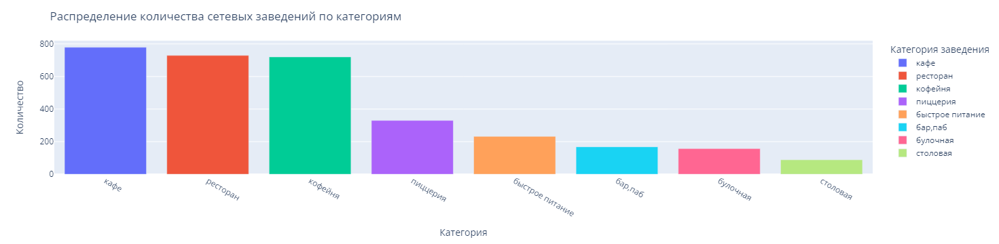

In [15]:
chain_object_types = data[data['chain']
                          ==1].groupby('category', 
                                       as_index=False).agg({'name':
                                                            'count'}).sort_values(by='name', ascending=False)
chain_object_types = chain_object_types.merge(places_types[['category', 'name']], 
                                              left_on='category', right_on='category')
# создадим таблицу, в которой будут отражены категория и количество сетевых заведений
chain_object_types.columns=['category', 'chain_objects', 'all_objects'] # переименуем столбцы
fig = px.bar(chain_object_types, x='category', y='chain_objects', color='category')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Распределение количества сетевых заведений по категориям',
    xaxis_title='Категория',
    yaxis_title='Количество', legend_title = 'Категория заведения')
fig.show()

Картина слабо поменялось относительно общего количества заведений по категориям, что логично, так как вывод делается относительно общего числа заведений, а не заведений в рамках одной категории.

Для того, чтобы увидеть, какие категории чаще бывают сетевыми, нужно построить отдельный график, в котором будут отражены доли сетевых заведений внутри категории относительно общего количества заведений в категории.

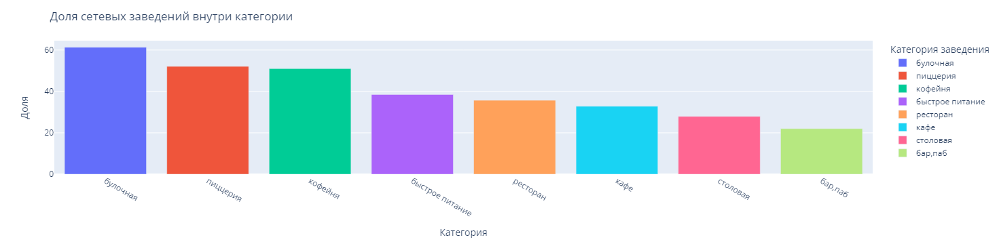

In [16]:
chain_object_types = data[data['chain']
                          ==1].groupby('category', 
                                       as_index=False).agg({'name':
                                                            'count'}).sort_values(by='name', ascending = False)
chain_object_types = chain_object_types.merge(places_types[['category', 'name']], 
                                              left_on='category', right_on='category')
chain_object_types.columns=['category', 'chain_objects', 'all_objects']
chain_object_types['share'] = ((chain_object_types['chain_objects'] /
                                chain_object_types['all_objects'])*100).round(1)
chain_object_types = chain_object_types.sort_values(by='share', ascending = False)
# добавим столбец с долей сетевых заведений от общего числа в рамках категории
fig = px.bar(chain_object_types, x='category', y='share', color='category')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Доля сетевых заведений внутри категории',
    xaxis_title='Категория',
    yaxis_title='Доля', legend_title = 'Категория заведения')
fig.show()

**Вывод**

Наиболая доля сетевых заведений приходится на булочные (более 60%), а меньше всего — на бары / пабы (менее четверти).

**3.4 Анализ популярнейших заведений Москвы**

Создадим таблицу, в которой будут названия сетей и количество ресторанов данной сети.

In [17]:
pop_places = data.groupby('name', as_index = False).agg(count = ('category', 'count')).sort_values('count', ascending = False)
pop_places.head(15)

,name,count
2825,кафе,189
5418,шоколадница,120
2532,домино'с пицца,77
2500,додо пицца,74
1137,one price coffee,72
5491,яндекс лавка,69
413,cofix,65
1263,prime,50
4993,хинкальная,44
5319,шаурма,43


Присутствуют заведения с общим названием (Кафе, Хинкальная, Шаурма, Чайхана, Ресторан). Нужно от них избавиться.

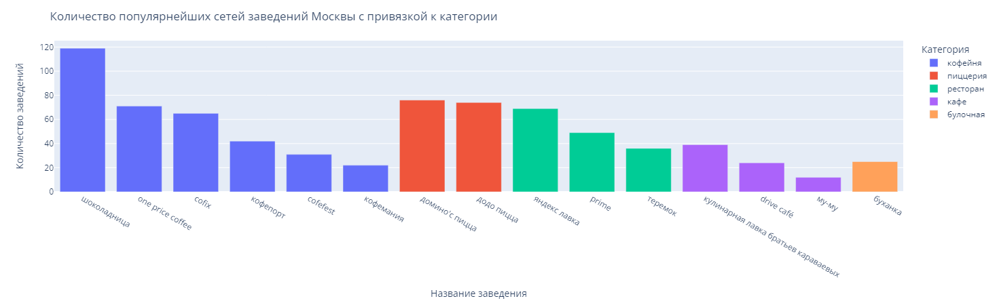

In [18]:
stop_list = data['category'].unique().tolist()
stop_list.extend(['кафе', 'ресторан', 'хинкальная', 'шаурма', 'чайхана', 'столовая'])   
# создадим список с исключением названий

pop_places_15 = pop_places[~pop_places['name'].isin(stop_list)].head(15)['name'].tolist()
pop_places_15 = data[data['name'].isin(pop_places_15)]   
# добавим исключения 
#pop_places_15 = pop_places_15.sort_values('count', ascending = False)
fig = px.bar(pop_places_15[pop_places_15['chain']
                          ==1].groupby(['name', 'category'], 
                                       as_index=False).agg(count=('category', 
                                                                  'count')).query('count>8').sort_values(by='count', 
                                                                                                         ascending = False),
    x='name', y='count', color='category')
fig.update_layout(title='Количество популярнейших сетей заведений Москвы с привязкой к категории',
    xaxis_title='Название заведения', yaxis_title='Количество заведений',
    legend_title='Категория', height=450)

fig.show()

Теперь нужно подумать, что объединяет данные заведения.

Предположим, человек захотел поесть. Что он будет делать? Как вариант, откроет Яндекс Карты и посмотрит заведения, находящиеся рядом. По какому признаку обычно выбирают заведение? Помимо вкусовых предпочтений смотрят на количество отзывов и средний рейтинг — чем больше отзывов и выше рейтинг, тем больше вероятность, что туда пойдёт человек, а значит принесёт месту прибыль, тем самым поспособствуя открытию новых кафе данной сети.

Проверим данную гипотизу.

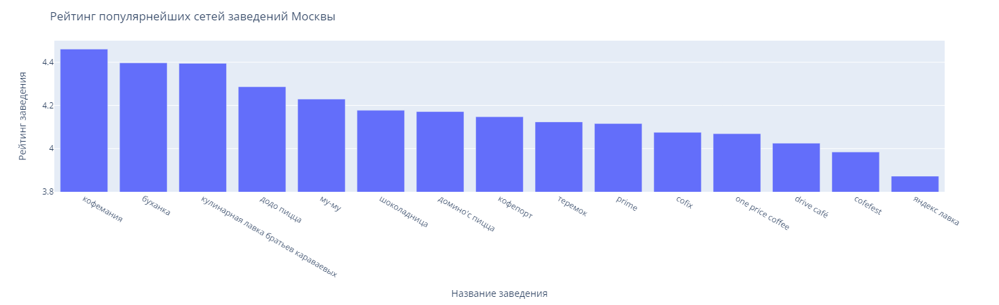

In [19]:
fig = px.bar(pop_places_15.groupby(['name'], as_index=False).agg(rating=('rating', 'mean')).sort_values(by='rating', 
                                                                                                         ascending = False),
    x='name', y='rating')
fig.update_layout(title='Рейтинг популярнейших сетей заведений Москвы',
    xaxis_title='Название заведения', yaxis_title='Рейтинг заведения', height=450, yaxis_range=[3.8, 4.5])

fig.show()

**Вывод** 

- наиболее популярные заведения имеют одну из категорий: кафе, кофейня, пиццерия, ресторан, булочная;
- практически все заведения имеют высокий рейтинг (минимальный — 3,9).

**3.5 Анализ заведений с привязкой к административным районам Москвы**

Посмотрим, сколько районов представлено в датасете и выведем на экран их названия.

In [20]:
data['district'].unique()
display('Количество административных районов:', len(data['district'].unique()), data['district'].unique())

'Количество административных районов:'

9

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Переименуем названия районов, оставив только аббревеатуру.

In [21]:
data['district'] = data['district'].replace(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], 
                                           ['САО', 'СВАО', 'СЗАО', 'ЗАО', 'ЦАО', 'ВАО', 'ЮВАО', 'ЮАО', 'ЮЗАО'])

Сгруппируем категории заведений по районам, укажем количество заведений.

In [22]:
district = data.groupby(['district', 'category'], 
                        as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)

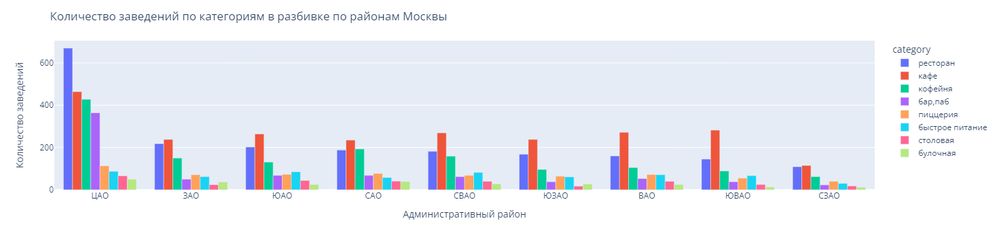

In [23]:
fig = px.bar(district, x ='district', y='count', color = 'category')

fig.update_layout(title='Количество заведений по категориям в разбивке по районам Москвы',
    xaxis_title='Административный район', yaxis_title='Количество заведений', barmode='group')

fig.show()

**Вывод**

Больше всего заведений в ЦАО, меньше всего в СЗАО. Чаще всего в районах преобладают кафе, но в ЦАО наибольшее количество заведений приходится на рестораны.

**3.6 Распределение средних рейтингов по категориям заведений**

Создадим таблицу, в которой оставим укажем категорию заведения, район, рейтинг, количество заведений.

In [24]:
district_rating = data.groupby(['category', 'district'], 
                                as_index = False).agg(count=('rating', 'mean')).sort_values('count', ascending=False)

Построим столбчатую диаграмму для визуализации результатов.

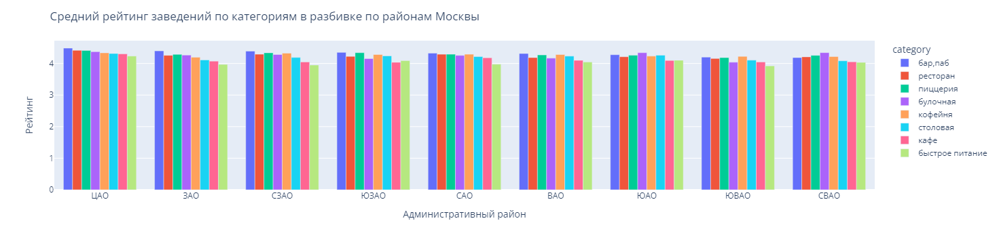

In [25]:
fig = px.bar(district_rating, x ='district', y='count', color = 'category')

fig.update_layout(title='Средний рейтинг заведений по категориям в разбивке по районам Москвы',
    xaxis_title='Административный район', yaxis_title='Рейтинг', barmode='group')

fig.show()

Так как минимальный рейтинг 3,93, а максимальный 4,49, укажем минимальное значение оси Y 3,9, а максимальное 4,5 для лучшей визуализации результата.

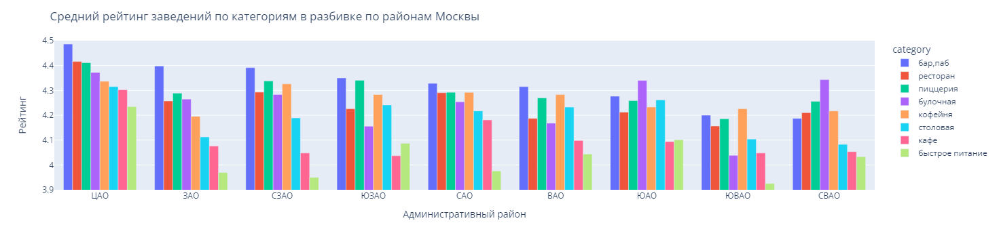

In [26]:
fig = px.bar(district_rating, x ='district', y='count', color = 'category')

fig.update_layout(title='Средний рейтинг заведений по категориям в разбивке по районам Москвы',
    xaxis_title='Административный район', yaxis_title='Рейтинг', barmode='group', yaxis_range=[3.9, 4.5])

fig.show()

**Вывод**

- наибольший средний рейтинг присущ заведениям, находящихся в ЦАО, а наименьший — в ЮВАО;
- самый высокий средний рейтинг у баров / пабов, самый низкий — у заведений быстрого питания.

**3.7 Фоновая карта заведений со средний райтингом для каждого района**

Создадим датафрейм, в котором будут названия районов и средний рейтинг заведений, и на основании него построим хороплет.

In [27]:
import os

In [28]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [29]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
# создадим датафрейм

state_geo = '/datasets/admin_level_geomap.geojson'
# загружаем JSON-файл с границами округов Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём карту Москвы

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.1,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_1)

# выводим карту
m_1

**Вывод**

Наибольший средний рейтинг заведений в ЦАО, наименьший — в ЮВАО.

**3.8 Карта заведений Москвы**

In [30]:
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём карту Москвы

marker_cluster = MarkerCluster().add_to(m_2)
# создаём пустой кластер, добавляем его на карту

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

data.apply(create_clusters, axis=1)
# применяем функцию create_clusters() к каждой строке датафрейма

m_2
# выводим карту

**3.9 Топ-15 улиц Москвы по количеству заведений**

Создадим таблицу, в которой будет информация о 15 улицих с наибольшим количеством заведений.

In [31]:
streets_pop = data.groupby('street').agg(count=('name', 'count')).sort_values('count', ascending=False).head(15).index.tolist()
street_pop_15 = data[data['street'].isin(
    streets_pop)].groupby(['street', 'category'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

In [32]:
fig = px.bar(street_pop_15, x ='count', y='street', color = 'category')

fig.update_layout(title='Топ-15 улиц Москвы по количеству заведений с разбивкой по категории заведения',
    xaxis_title='Количество заведений', yaxis_title='Улица', barmode='stack')

fig.show()

**Вывод**

Более 100 заведений имеют 4 улицы:
- проспект Мира;
- Профсоюзная;
- проспект Вернадского;
- Ленинский проспект.

Это может быть связано с протяжённостью данных улиц.

**3.10 Улицы Москвы с одним заведением общественного питания**

Создадим таблицу, в которой будет информация об улицах с одним заведением.

In [33]:
one_rest = data.groupby('street').agg(count=(
    'name', 'count')).sort_values(
    'count', ascending=False).query('count == 1').index.tolist()
one_rest_streets = data[data[
    'street'].isin(one_rest)].groupby(['category', 'street', 'lat', 'lng'], as_index=False).agg(count=(
    'name', 'count')).sort_values('count', ascending=False)
one_rest_streets

,category,street,lat,lng,count
0,"бар,паб",1-й Голутвинский переулок,55.739600,37.613494,1
272,кофейня,улица Розанова,55.772832,37.542433,1
282,пиццерия,Маленковская улица,55.786873,37.675358,1
281,пиццерия,Костромская улица,55.884819,37.598559,1
280,пиццерия,Игарский проезд,55.857770,37.645850,1
...,...,...,...,...,...
135,кафе,Лечебная улица,55.790378,37.733904,1
134,кафе,Леонтьевский переулок,55.761203,37.605910,1
133,кафе,Лазаревский переулок,55.790745,37.613212,1
132,кафе,Кутузовский проезд,55.739280,37.524907,1


Всего строк улиц с одним заведением 414. Посмотрим, в каком районе их больше всего.

In [34]:
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём карту Москвы

marker_cluster = MarkerCluster().add_to(m_3)
# создаём пустой кластер, добавляем его на карту

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['count']}",
    ).add_to(marker_cluster)
    
one_rest_streets.apply(create_clusters, axis=1)
# применяем функцию create_clusters() к каждой строке датафрейма

m_3
# выводим карту

Видно, что больше всего заведений-одиночек находится в центре, меньше всего на окраинах, что напрямую связано с количеством заведений.

Посмотрим, одиночных заведений каких категорий больше всего.

In [35]:
ors_group = one_rest_streets.groupby('category')['count'].count().to_frame().reset_index().sort_values('count', ascending=False)
#создадим таблицу, в которой оставим только категорию и количество единичных заведений

In [36]:
fig = px.bar(ors_group, x ='category', y='count', color = 'category')

fig.update_layout(title='Количество единичных заведений по категориям',
    xaxis_title='Количество заведений', yaxis_title='Категория')

fig.show()

На фоне остальных по количеству несетевых заведений выделяются кафе, рестораны и кофейни (в этих категориях их больше всего).

**Вывод**

- чем ближе к центру, тем больше несетевых заведений;
- больше всего несетевых заведений в категориях кафе, рестораны и кофейни.

Предположительно это связано с количеством людей, посещающих заведения общепита — в пиццерии / столовые / рестораны быстрого питания ходят чаще, чем в кафе / рестораны, поэтому приносят большую выручку, позволяющую открывать дополнительные филиалы.

**3.11 Анализ цен в заведениях общепита Москвы**

Создадим таблицу, в которой будут отображены величины среднего чека в зависимости от района.

In [37]:
avg_bill_mean = data.groupby('district', as_index=False).agg(avg_bill=('middle_avg_bill', 'median'))
avg_bill_mean['avg_bill'] = round(avg_bill_mean['avg_bill'])

Визуализируем эти данные.

In [38]:
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём карту Москвы

Choropleth(
    geo_data=state_geo,
    data=avg_bill_mean,
    columns=['district', 'avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.0,
    legend_name='Средний чек заведений по районам Москвы',
).add_to(m_4)

# выводим карту
m_4

**Вывод**

Наибольший средний чек в ЦАО и ЗАО, наименьший — в ЮВАО.

**3.12 Зависимость расположения и категорий заведения от часов работы**

In [39]:
m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём карту Москвы

Choropleth(
    geo_data=state_geo,
    data=data.query('is_24_7 == True').groupby('district', as_index=False).agg(is_24_7=('is_24_7', 'count')),
    columns=['district', 'is_24_7'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.0,
    legend_name='Количество круглосуточных заведений по районам Москвы',
).add_to(m_5)

# выводим карту
m_5


Посмотрим, сколько заведений в каждой категории работают круглосуточно.

In [40]:
fig = px.bar(data.query('is_24_7 == True').groupby('category', 
                  as_index=False).agg(is_24_7=('is_24_7', 
                                               'count')).sort_values('is_24_7', 
                                                                     ascending=
                                                                     False), x='is_24_7', y='category', color = 'category')

fig.update_layout(title='Количество круглосуточных заведений по категориям',
    xaxis_title='Количество заведений', yaxis_title='Категория')

fig.show()

**Вывод**

- больше всего заведений из категорий кафе, ресторан и кофейня, меньше всего — столовая и булочная;
- количество мест в среднем больше в ресторанах и барах/пабах (более 90), меньше всего в булочных (менее 90);
- сетевых заведений больше, чем несетевых на 20%;
- больше всего сетевых заведений приходится на булочные, меньше всего — на бары и пабы;
- все заведения имеют рейтинг не менее 3,9;
- наибольший средний рейтинг имеют бары и пабы, наименьший — заведения быстрого питания;
- в ЦАО располагаются заведения с наибольшим средним рейтингом, а в ЮВАО — с наименьшим;
- больше всего заведений располагается в ЦАО, меньше всего в СЗАО;
- наиболее популярной категорией заведений является кафе;
- более 100 заведений располагается на улицах Проспект Мира, Профсоюзная, проспект Вернадского и Ленинский проспект, что может быть связано с протяжённостью улиц;
- при удалённости от центра увеличивается количество сетевых заведений;
- больше всего заведений с круглосуточным обслуживанием приходится на кафе, меньше всего на столовые;

**Вывод**

- больше всего заведений из категорий кафе, ресторан и кофейня, меньше всего — столовая и булочная;
- количество мест в среднем больше в ресторанах, барах / пабах и кофейнях (более или равно 80), меньше всего в булочных и в пиццериях (менее 60);
- сетевых заведений больше, чем несетевых на 20%;
- больше всего сетевых заведений приходится на булочные, меньше всего — на бары и пабы;
- все заведения имеют рейтинг не менее 3,9;
- наибольший средний рейтинг имеют бары и пабы, наименьший — заведения быстрого питания;
- в ЦАО располагаются заведения с наибольшим средним рейтингом, а в ЮВАО — с наименьшим;
- больше всего заведений располагается в ЦАО, меньше всего в СЗАО;
- наиболее популярной категорией заведений является кафе;
- более 100 заведений располагается на улицах Проспект Мира, Профсоюзная, проспект Вернадского и Ленинский проспект, что может быть связано с протяжённостью улиц;
- при удалённости от центра увеличивается количество сетевых заведений;
- больше всего заведений с круглосуточным обслуживанием приходится на кафе, меньше всего на столовые;

## Детализация исследования: открытие кофейни

Начнём с того, что посмотрим, сколько всего кофейнь в датасете.

In [41]:
coffee = data[data['category'] == 'кофейня'] # создадим переменную, в которой будут строки с кофейнями

In [42]:
print('В данном датасете кофейнь', coffee.shape[0])

В данном датасете кофейнь 1413


Теперь посмотрим, как количество кофейнь распределяются по районам.

In [43]:
coffee_district = coffee.groupby('district', as_index=
                                           False).agg(count=('name', 'count')).sort_values('count', ascending=False)
# создадим переменную, в которой будет таблица с количеством кофейнь в зависимости от района

fig = px.bar(coffee_district, x ='district', y='count', color = 'district')

fig.update_layout(title='Количество кофейнь в районах Москвы',
    xaxis_title='Административный район', yaxis_title='Количество заведений', 
                  legend_title = 'Административный район Москвы')

fig.show()

Посмотрим соотношение круглосуточных заведений к некруглосуточным.

In [44]:
coffee_24_7 = coffee.groupby(by=['district', 'is_24_7'], as_index=
                             False).agg(count=('name', 'count')).sort_values('count', ascending=False)
# создадим переменную, в которой будет таблица с количеством круглосуточных / некруглосуточных кофейнь в зависимости от района

fig = px.bar(coffee_24_7, x ='district', y='count', color = 'is_24_7')
fig.update_layout(title='Отношение круглосуточных кофейнь к некруглосуточным в районах Москвы',
    xaxis_title='Административный район', yaxis_title='Количество заведений', legend_title = 'Круглосуточное заведение?')
fig.show()

Теперь изучим средний рейтинг кофейнь относительно района.

In [45]:
coffee_rating = coffee.groupby('district', as_index=
                                           False).agg(rating=('rating', 'mean')).sort_values('rating', ascending=False)
# создадим переменную, в которой будет таблица со средним рейтингом кофейнь в зависимости от района

fig = px.bar(coffee_rating, x ='district', y='rating', color = 'district')
fig.update_layout(title='Средний рейтинг кофейнь в районах Москвы',
    xaxis_title='Административный район', legend_title = 'Административный район Москвы', 
                  yaxis_title='Средний рейтинг', yaxis_range=[4.1, 4.4])
fig.show()

Изучим зависимость средней цены за чашку капучино от района Москвы.

In [46]:
coffee_cup = coffee.groupby('district', as_index=
                                           False).agg(cup=('middle_coffee_cup', 'mean')).sort_values('cup', ascending=False)
# создадим переменную, в которой будет таблица с рейтингом кофейнь в зависимости от района

fig = px.bar(coffee_cup, x ='district', y='cup', color = 'district')
fig.update_layout(title='Средняя стоимость чашки капучино в районах Москвы',
    xaxis_title='Административный район', yaxis_title='Средняя стоимость чашки капучино', 
                  legend_title = 'Административный район Москвы', yaxis_range=[140.0, 195.0])
fig.show()

Создадим датафрейм, в котором будет находиться информация о численности населения районов Москвы.

Источник: https://www.statdata.ru/naselenie-moskvy-po-okrugam-i-rajonam

In [47]:
population = pd.DataFrame({'district': ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'], 
                           'population': [1524265, 1395986, 1186128, 1432571, 1011387, 779352, 1431746, 1446432, 1791187]})

Теперь объединим созданный датайрефм с датафреймом, в котором содержится информация о количестве кофейн. Сразу добавим дополнительный столбец, в котором рассчитаем, на сколько человек рассчитана одна кофейня в каждом из районов. Отобразим полученную информацию с помощью гистограммы.

In [48]:
coffee_population = pd.merge(coffee_district, population, how = 'left', on = 'district')
coffee_population['coffee_per_person'] = round(coffee_population['population'] / coffee_population['count'], 0)

fig = px.bar(coffee_population.sort_values('coffee_per_person', ascending=False), 
             x ='district', y='coffee_per_person', color = 'district')
fig.update_layout(title='Количество человек на одну кофейню в районах Москвы',
    xaxis_title='Административный район', yaxis_title='Количество человек', 
                  legend_title = 'Административный район Москвы')
fig.show()

**Вывод**

Наибольшее количество кофейнь с большим отрывом приходится на ЦАО. В тройку входят САО и СВАО. 
Меньше всего кофейнь располагается в СЗАО, ЮВАО и ЮЗАО.

Прослеживается зависимость между количеством кофейнь и численностью населения в районе. Чем больше кофейнь, тем на меньшее количество людей они рассчитаны. Например, в ЦАО, где больше всего заведений данной категории, на одну кофейню приходится менее 2 тысяч человек, в то время как в СЗАО больше 16 тысяч человек обслуживаются в одном заведении.

При этом средний рейтинг кофейнь в СЗАО один из высших относительно других районов (выше 4,3), следовательно составить конференцию будет сложнее. 

В ЮВАО ситуация немногим лучше — на одну кофейню также приходится больше 16 тысяч человек, но при этом средний рейтинг заведений ниже (4,2), цена за чашку капучино меньше (150 рублей), чем у того же СЗАО (165 рублей).

В ЮВАО всего одна круглосуточная кофейня на 87 заведений, в то время как в СЗАО 2 на 62. 

На основе описанных выше выводов можно порекомендовать открыть заведение в ЮВАО, которое будет работать круглосуточно (для того, чтобы выделиться на фоне остальных кофейнь) и иметь цену за чашку капучино 150 рублей.

Презентация: https://drive.google.com/file/d/16D_5tVpe6IcE4nAvqRwgHOVtOgv8aMkO/view?usp=sharing